In [1]:
""" Created on November 9, 2022 // @author: Sarah Shi and Penny Wieser """

import numpy as np
import pandas as pd
import scipy
import time 
import random
import torch
import torch.nn as nn
from torch.nn.modules.activation import LeakyReLU, Sigmoid
from torch.utils.data import Dataset, DataLoader
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') 

import os 
import json 
import pickle
import pygmt
import warnings
warnings.simplefilter('ignore', category=FutureWarning)
from scipy.sparse import (spdiags, SparseEfficiencyWarning, csc_matrix,
    csr_matrix, isspmatrix, dok_matrix, lil_matrix, bsr_matrix)
warnings.simplefilter('ignore', category=SparseEfficiencyWarning)

from scipy.special import softmax

from sklearn import datasets
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, KernelPCA
from sklearn.manifold import Isomap, LocallyLinearEmbedding, TSNE
from sklearn.preprocessing import scale, normalize, StandardScaler
from sklearn.tree import DecisionTreeClassifier

import TAS_Functions as tas
import Thermobar as pt

import matplotlib
from matplotlib import pyplot as plt
from matplotlib import rc
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import matplotlib.patches as mpatches
import matplotlib.cm as mcm
import matplotlib.path as mpath
import matplotlib.colors as mcolors

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
rc('font',**{'family':'Avenir', 'size': 14})
plt.rcParams['pdf.fonttype'] = 42

pt.__version__

'1.0.4'

In [2]:
def calculate_mol_proportions(comps):

    '''Import mineral compositions using comps=My_Oxides, returns mole proportions. 

    Parameters
    -------
    comps: pandas.DataFrame
            Panda DataFrame of oxide compositions with column headings SiO2, MgO etc.

    Returns
    -------
    pandas DataFrame
        mole proportions for oxides with column headings of the form SiO2_mol_prop
    '''

    oxide_mass_ox = {'SiO2': 60.0843, 'MgO': 40.3044, 'FeOt': 71.8464,
    'CaO': 56.0774,'Al2O3': 101.961, 'Na2O': 61.9789, 'K2O': 94.196,
    'MnO': 70.9375, 'TiO2': 79.7877, 'Cr2O3': 151.9982, 'P2O5': 141.937}

    oxide_mass_df = pd.DataFrame.from_dict(oxide_mass_ox, orient='index').T
    oxide_mass_df['Sample_ID'] = 'MolWt'
    oxide_mass_df.set_index('Sample_ID', inplace=True)

    # This makes it match the columns in the oxide mass dataframe
    wt = comps.reindex(oxide_mass_df.columns, axis=1).fillna(0)
    # Combine the molecular weight and weight percent dataframes
    wt_combo = pd.concat([oxide_mass_df, wt],)
    # Drop the calculation column
    mol_prop_anhyd = wt_combo.div(
        wt_combo.loc['MolWt', :], axis='columns').drop(['MolWt'])
    mol_prop_anhyd.columns = [
        str(col) + '_mol_prop' for col in mol_prop_anhyd.columns]
    return mol_prop_anhyd



class FeatureDataset(Dataset):
    def __init__(self, x):
        if len(x.shape)==2:
            self.x = x
        else:
            self.x = x.reshape(-1, x.shape[-1]) #dataset keeps the right shape for training

    def __len__(self):
        return self.x.shape[0] 
    
    def __getitem__(self, n): 
        return torch.Tensor(self.x[n])


def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

class Autoencoder(nn.Module):
    def __init__(self,input_dim = 10, latent_dim = 2):
        super(Autoencoder, self).__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim

        self.encode = nn.Sequential(nn.Linear(self.input_dim,512),
                                     nn.LeakyReLU(0.02),
                                     
                                     nn.Linear(512,256),
                                     nn.LeakyReLU(0.02),
                                     
                                     nn.Linear(256,128),
                                     nn.LeakyReLU(0.02),
                                     
                                     nn.Linear(128,self.latent_dim)
                                    )

        self.decode = nn.Sequential(nn.Linear(self.latent_dim,128),
                                     nn.LeakyReLU(0.02),
                                     
                                     nn.Linear(128,256),
                                     nn.LeakyReLU(0.02),
                                     
                                     nn.Linear(256,512),
                                     nn.LeakyReLU(0.02),
                                     
                                     nn.Linear(512,self.input_dim)
                                    )
        

        self.apply(weights_init)

    def encoded(self, x):
        #encodes data to latent space
        return self.encode(x)

    def decoded(self, x):
        #decodes latent space data to 'real' space
        return self.decode(x)

    def forward(self, x):
        en = self.encoded(x)
        de = self.decoded(en)
        return de

class Shallow_Autoencoder(nn.Module):
    def __init__(self,input_dim = 10, latent_dim = 2):
        super(Shallow_Autoencoder, self).__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim

        self.encode = nn.Sequential(nn.Linear(self.input_dim,64),
                                     nn.LeakyReLU(0.02),
                                     nn.Linear(64,32),
                                     nn.LeakyReLU(0.02),
                                     nn.Linear(32,self.latent_dim)
                                    )

        self.decode = nn.Sequential(nn.Linear(self.latent_dim,32),
                                     nn.LeakyReLU(0.02),
                                     nn.Linear(32,64),
                                     nn.LeakyReLU(0.02),
                                     nn.Linear(64,self.input_dim)
                                    )
        

        self.apply(weights_init)

    def encoded(self, x):
        #encodes data to latent space
        return self.encode(x)

    def decoded(self, x):
        #decodes latent space data to 'real' space
        return self.decode(x)

    def forward(self, x):
        en = self.encoded(x)
        de = self.decoded(en)
        return de


class Tanh_Autoencoder(nn.Module):
    def __init__(self,input_dim = 10, latent_dim = 2):
        super(Tanh_Autoencoder, self).__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim

        self.encode = nn.Sequential(nn.Linear(self.input_dim,64),
                                     nn.Tanh(),
                                     nn.Linear(64,32),
                                     nn.Tanh(),
                                     nn.Linear(32,self.latent_dim)
                                    )

        self.decode = nn.Sequential(nn.Linear(self.latent_dim,32),
                                     nn.Tanh(),
                                     nn.Linear(32,64),
                                     nn.Tanh(),
                                     nn.Linear(64,self.input_dim)
                                    )

    def encoded(self, x):
        #encodes data to latent space
        return self.encode(x)

    def decoded(self, x):
        #decodes latent space data to 'real' space
        return self.decode(x)

    def forward(self, x):
        en = self.encoded(x)
        de = self.decoded(en)
        return de


def train(model, optimizer, train_loader, test_loader, n_epoch, criterion):
    
    avg_total_loss = []
    avg_test_loss = []

    for epoch in range(n_epoch):
        # Training
        model.train()
        t = time.time()
        total_loss = []
        for i, data in enumerate(train_loader):
            x = data.to(device)
            x_recon = model(x)
            loss = criterion(x_recon, x)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss.append(loss.detach().item())
        
        # Testing
        model.eval()
        test_loss = []
        for i, test in enumerate(test_loader):
            x = test.to(device)
            x_recon = model(x)
            loss = criterion(x_recon, x)
            test_loss.append(loss.detach().item())
        
        # Logging
        avg_loss = sum(total_loss) / len(total_loss)
        avg_test = sum(test_loss) / len(test_loss)
        avg_total_loss.append(avg_loss)
        avg_test_loss.append(avg_test)
        
        training_time = time.time() - t
        
        print(f'[{epoch+1:03}/{n_epoch:03}] train_loss: {avg_loss:.6f}, test_loss: {avg_test:.6f}, time: {training_time:.2f} s')

    return avg_total_loss, avg_test_loss

def save_model(model, optimizer, path):
    check_point = {'params': model.state_dict(),                            
                   'optimizer': optimizer.state_dict()}
    torch.save(check_point, path)

def load_model(model, optimizer=None, path=''):
    check_point = torch.load(path)
    model.load_state_dict(check_point['params'])
    if optimizer is not None:
        optimizer.load_state_dict(check_point['potimizer'])

def getLatent(model, dataset:np):
    #transform real data to latent space using the trained model
    latents=[]
    model.to(device)

    dataset_ = FeatureDataset(dataset)
    loader = DataLoader(dataset_,batch_size=20,shuffle=False)
    
    with torch.no_grad():
        model.eval()
        for i, data in enumerate(loader):
            x = data.to(device)
            z = model.encoded(x)
            latents.append(z.detach().cpu().numpy())
    
    return np.concatenate(latents, axis=0)

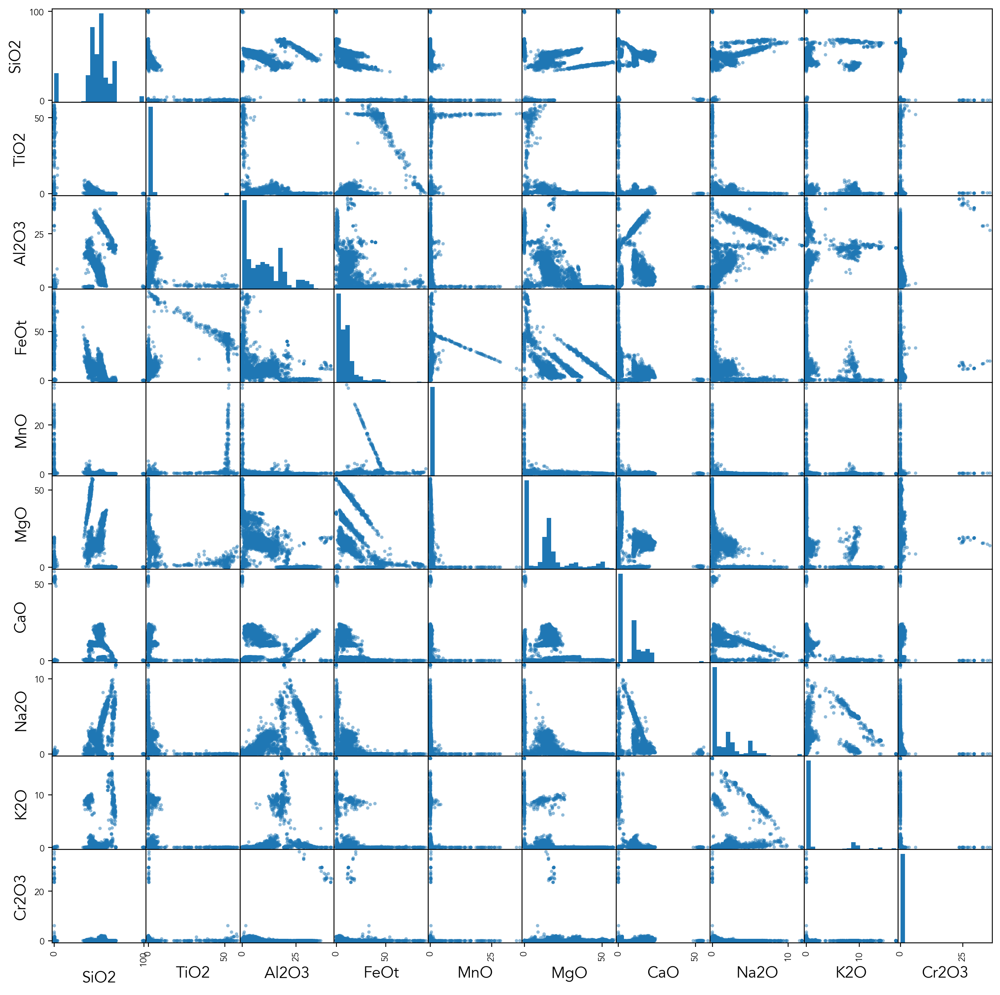

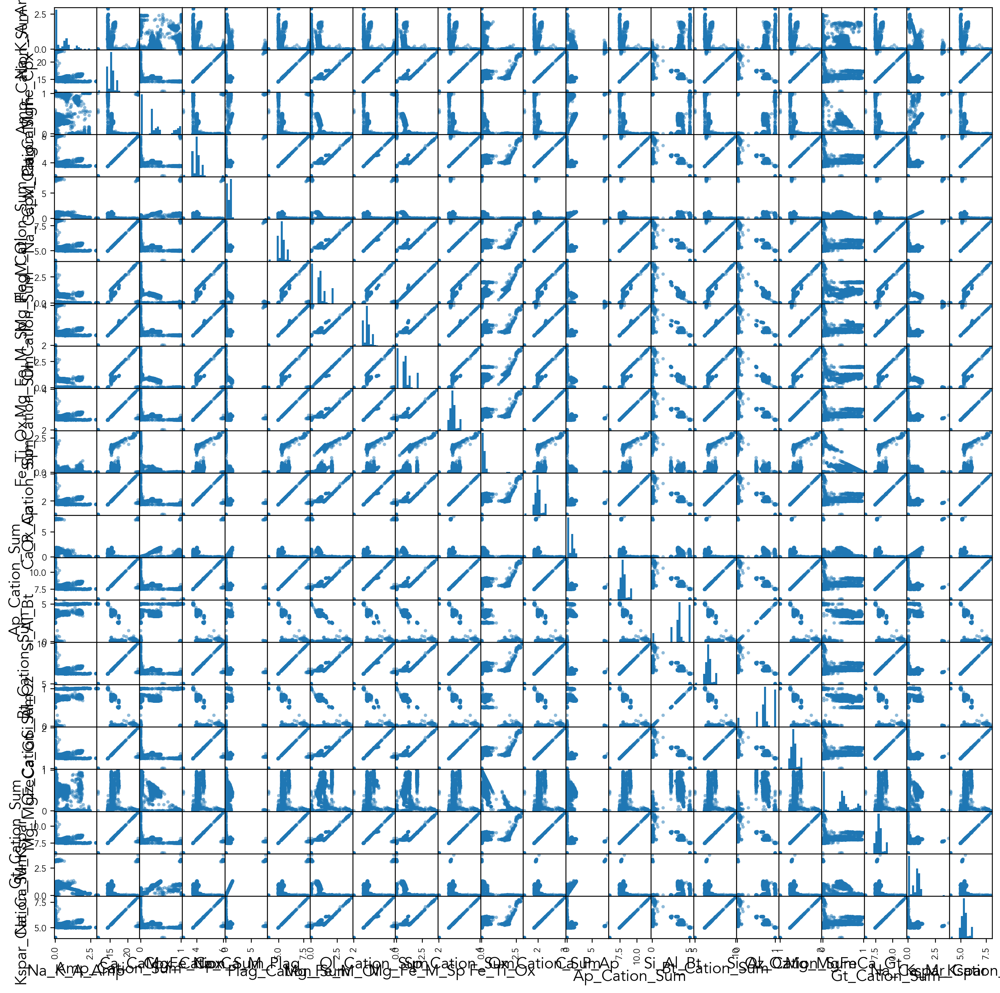

In [3]:
LEPR_AllPhases = pd.read_csv('./LEPR/LEPR_AllPhases.csv')

oxides = ['SiO2', 'TiO2', 'Al2O3', 'FeOt', 'MnO', 'MgO', 'CaO', 'Na2O', 'K2O', 'Cr2O3']
pd.plotting.scatter_matrix(LEPR_AllPhases[oxides], figsize = (15, 15), hist_kwds={'bins':20})
plt.show()

phase_props = ['Na_K_A_Amp', 'Amp_Cation_Sum', 'Ca_CaMgFe_Cpx', 'Cpx_Cation_Sum', 
        'Na_Ca_M_Plag', 'Plag_Cation_Sum', 'Mg_Fe_M_Ol', 'Ol_Cation_Sum', 
        'Mg_Fe_M_Sp', 'Sp_Cation_Sum', 'Fe_Ti_Ox', 'Ox_Cation_Sum', 
        'Ca_P_Ap', 'Ap_Cation_Sum', 'Si_Al_Bt', 'Bt_Cation_Sum', 
        'Si_Al_Qz', 'Qz_Cation_Sum', 'Mg_MgFeCa_Gt', 'Gt_Cation_Sum', 
        'Na_Ca_M_Kspar', 'Kspar_Cation_Sum']
pd.plotting.scatter_matrix(LEPR_AllPhases[phase_props], figsize = (15, 15), hist_kwds={'bins':20})


LEPR_wt = LEPR_AllPhases[oxides]
LEPR_wt = LEPR_wt.to_numpy()

LEPR_wt_norm = normalize(LEPR_wt)
ss = StandardScaler()
LEPR_wt_scale = ss.fit_transform(LEPR_wt)
LEPR_wt_softmax = softmax(LEPR_wt_norm, axis = 1)

LEPR_prop = LEPR_AllPhases[phase_props]
LEPR_prop = LEPR_prop.fillna(0).to_numpy()

LEPR_prop_norm = normalize(LEPR_prop)
ss = StandardScaler()
LEPR_prop_scale = ss.fit_transform(LEPR_prop)
LEPR_prop_softmax = softmax(LEPR_prop_norm, axis = 1)
# LEPR_wt_standardscale = ss.fit_transform(LEPR_wt)

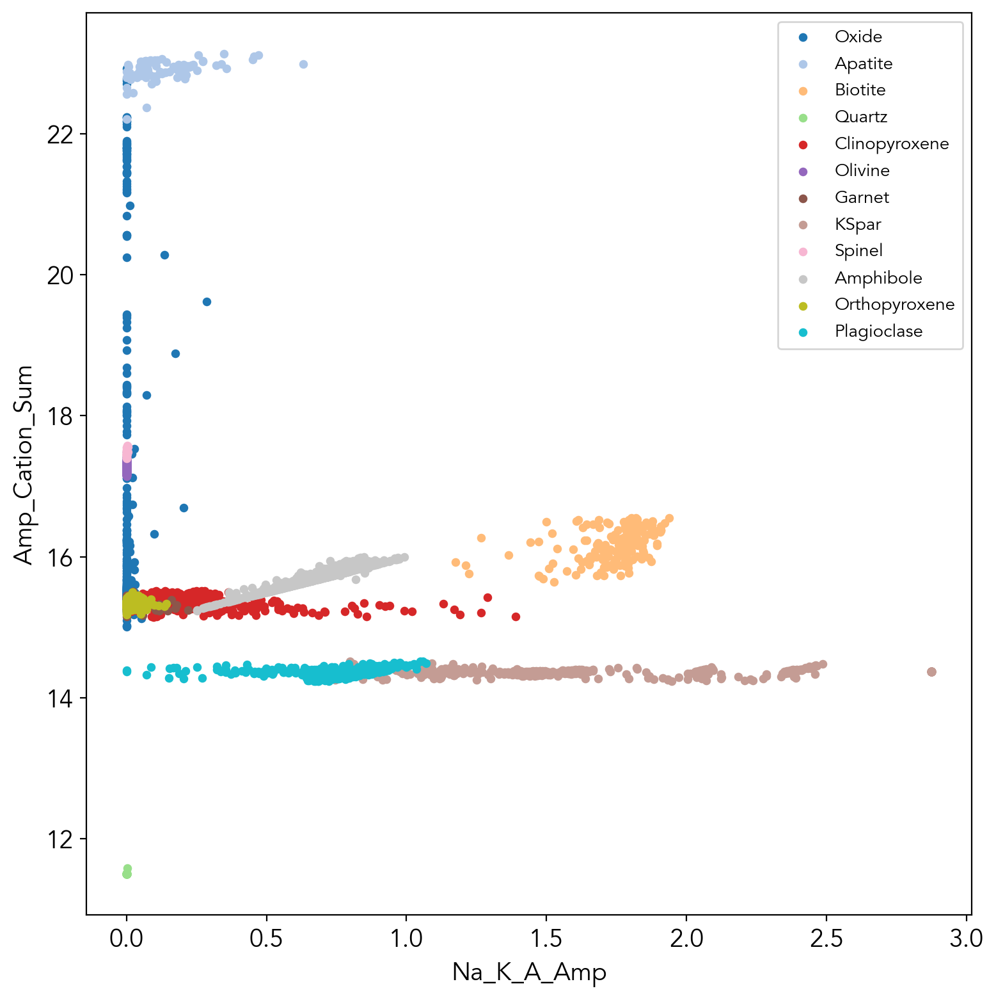

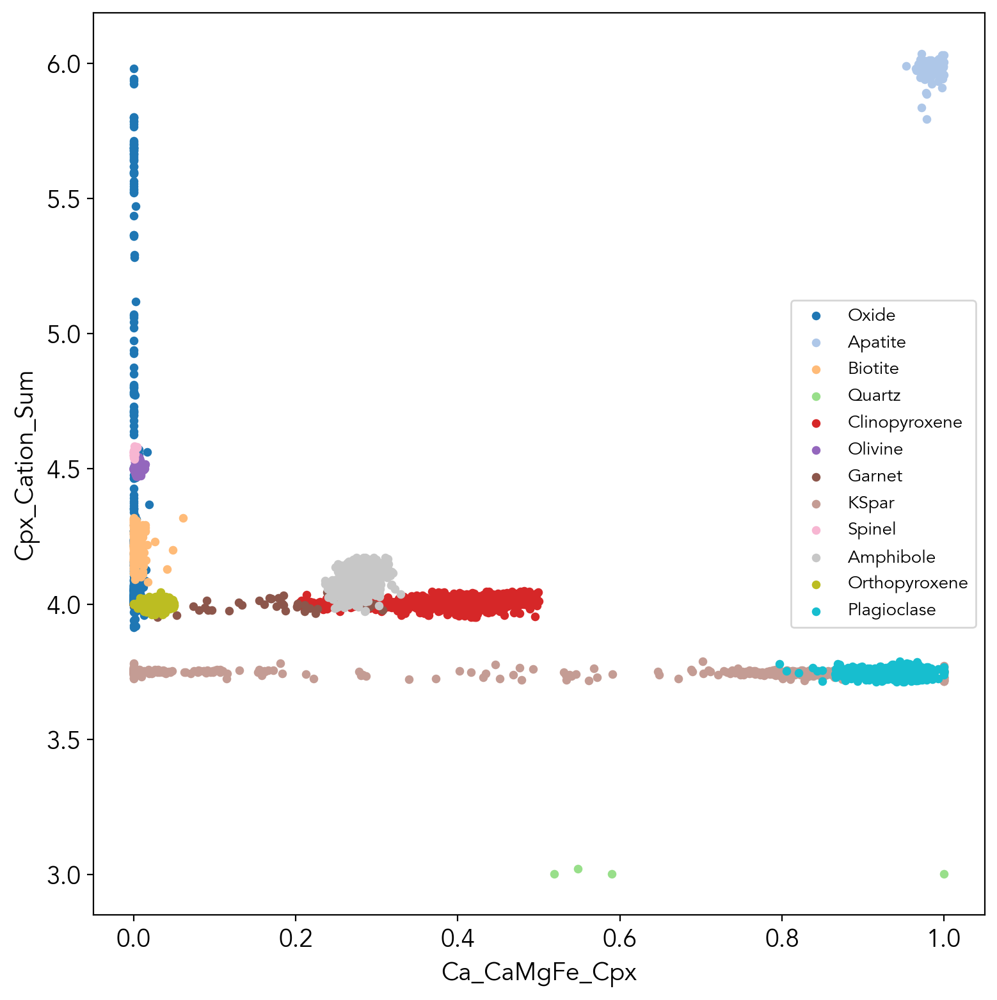

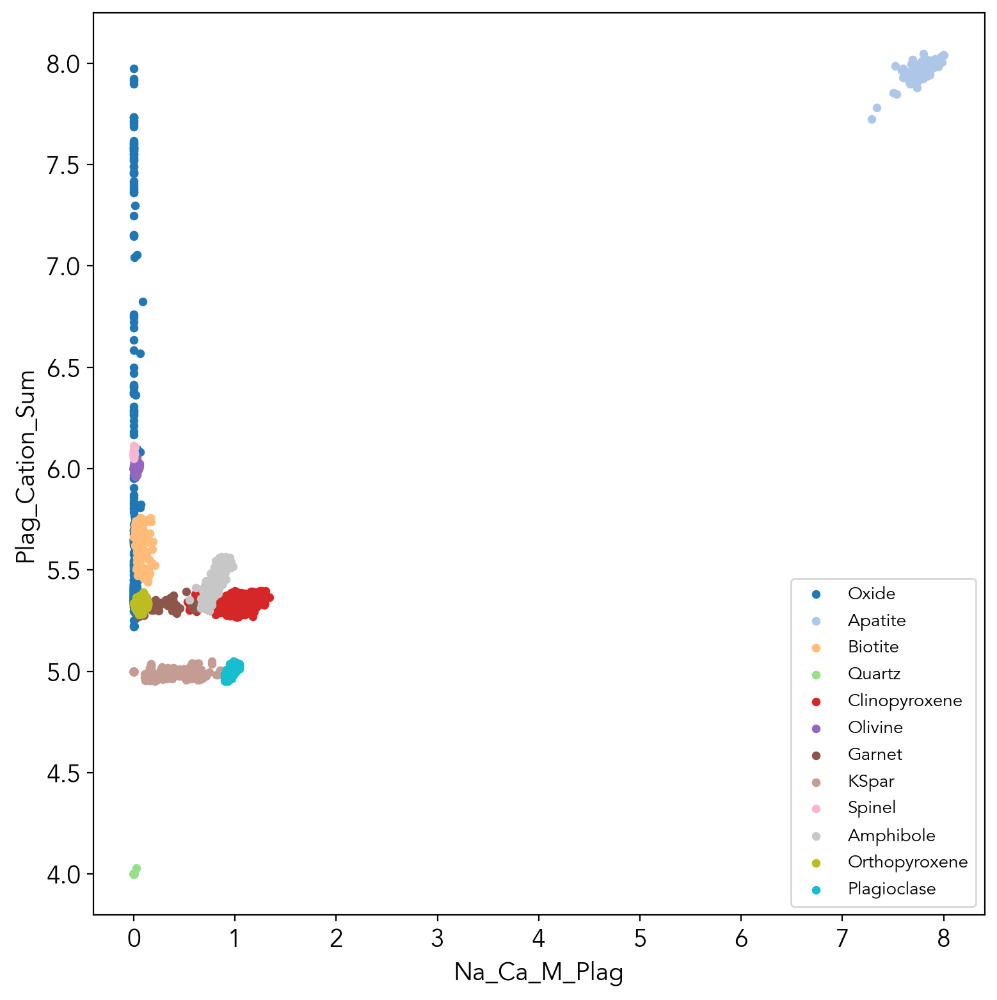

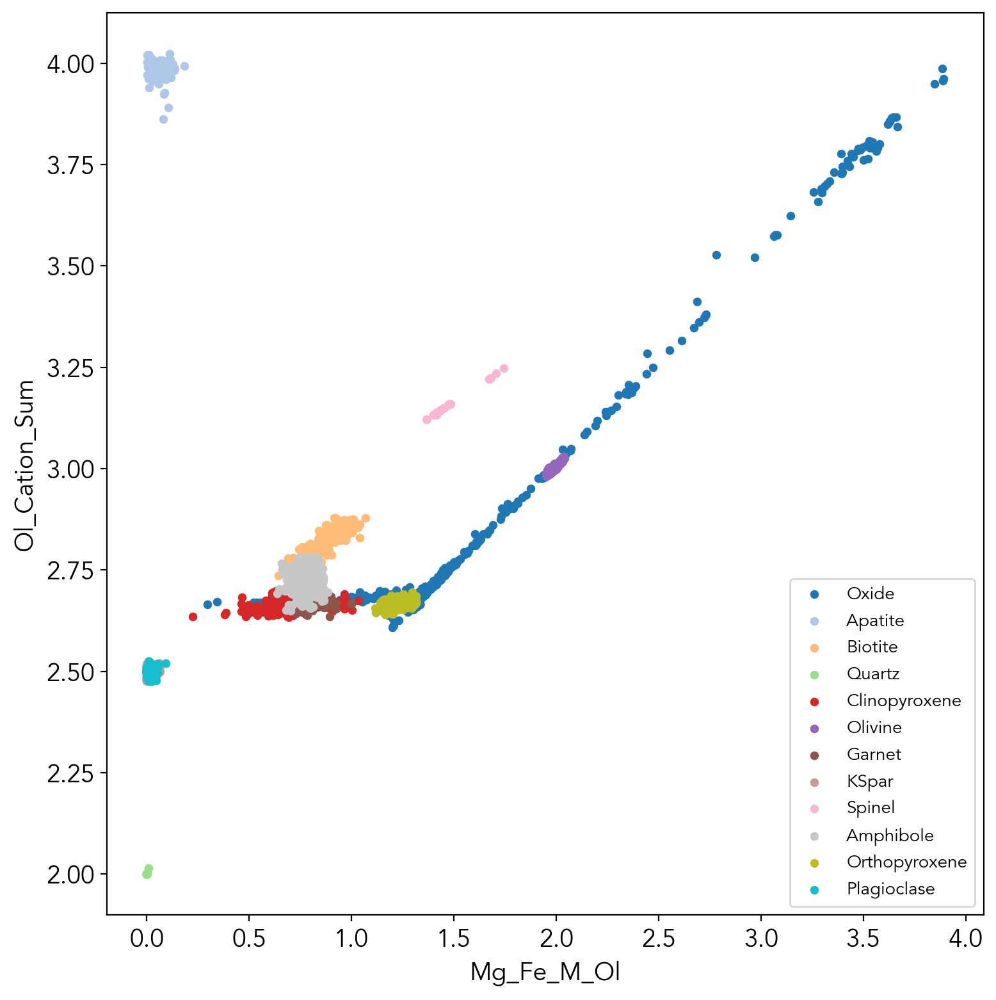

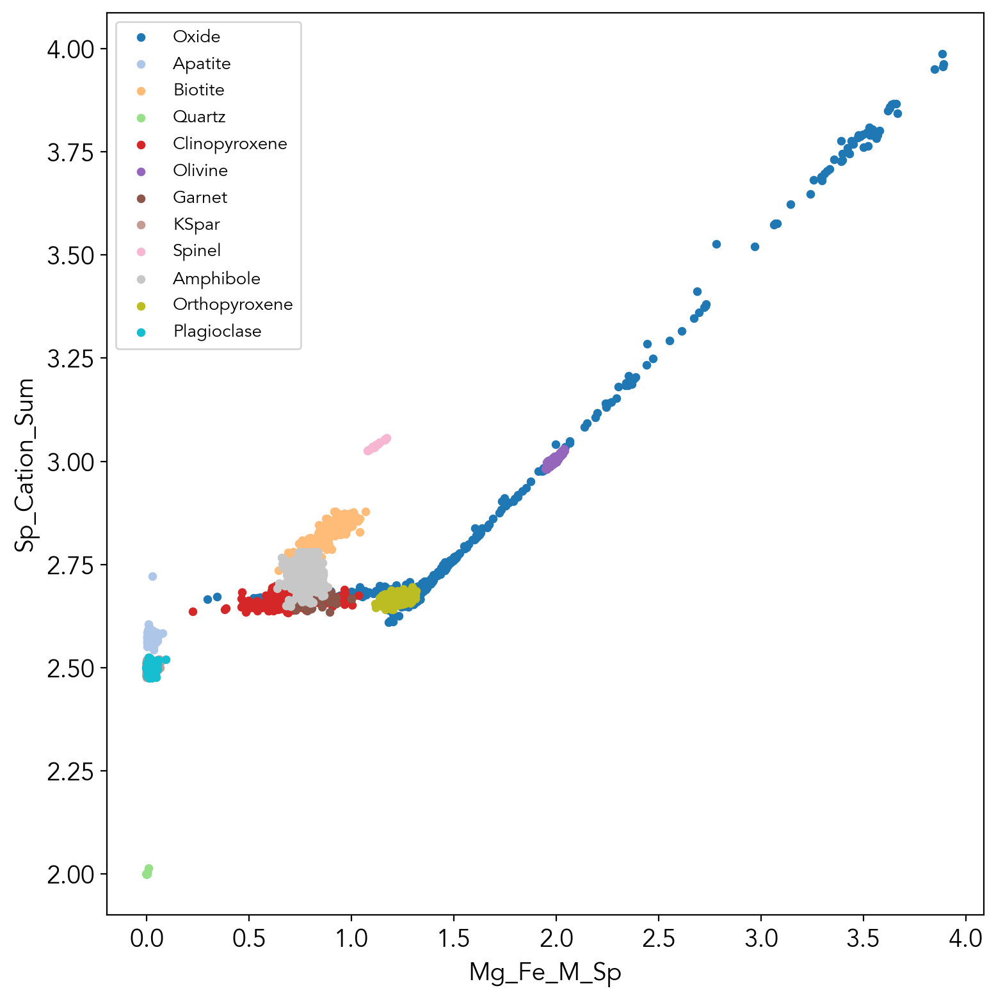

...

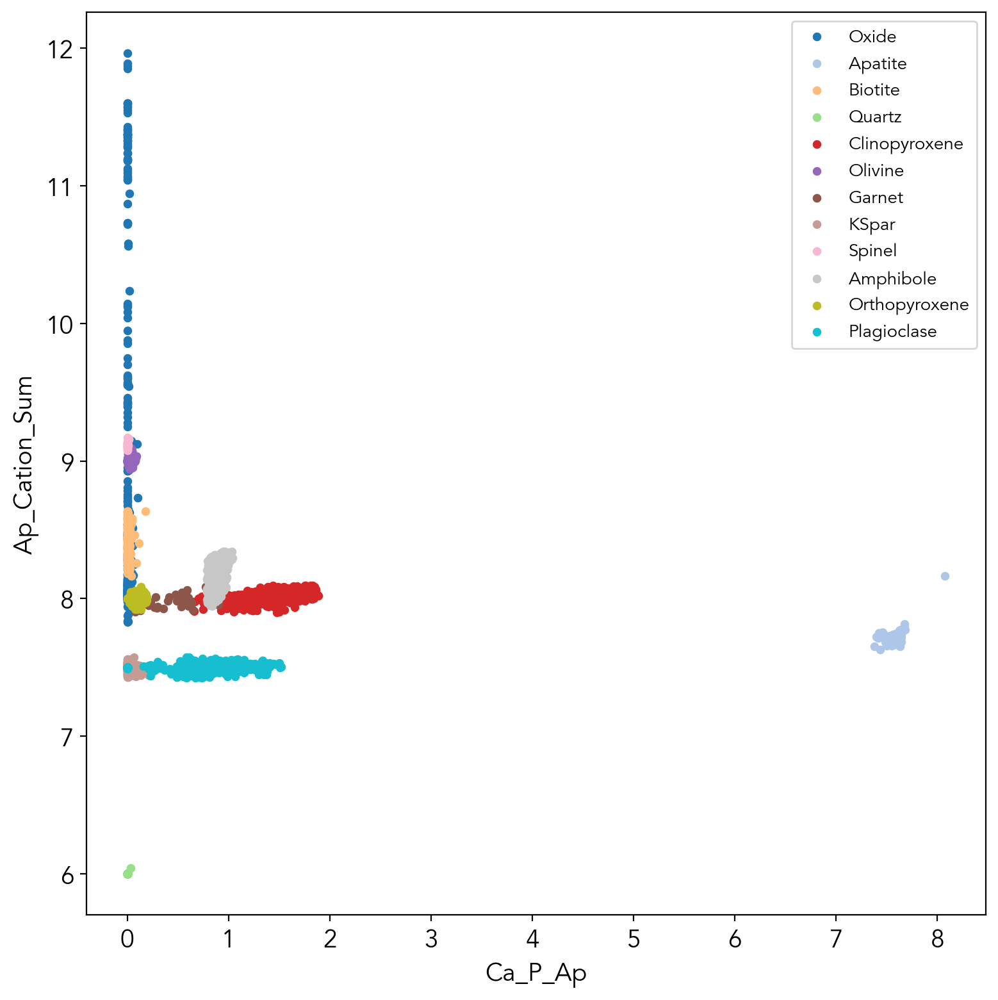

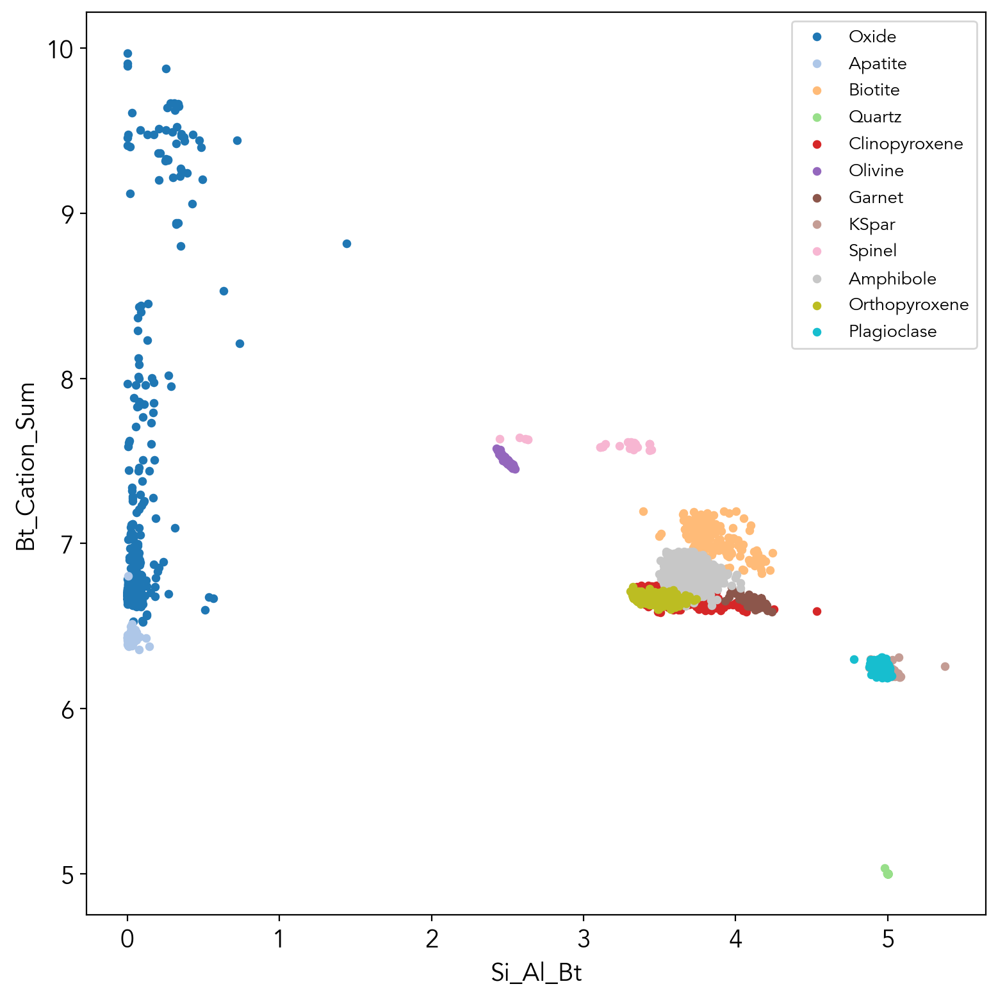

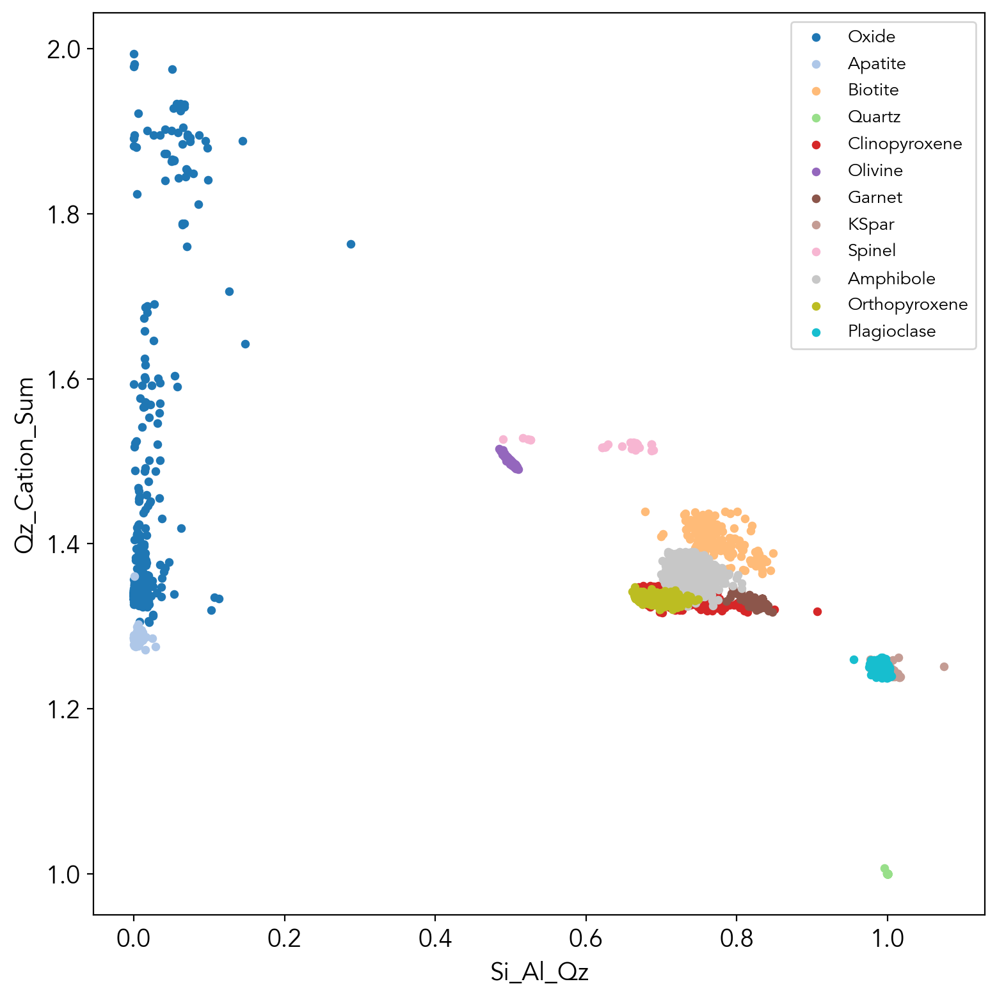

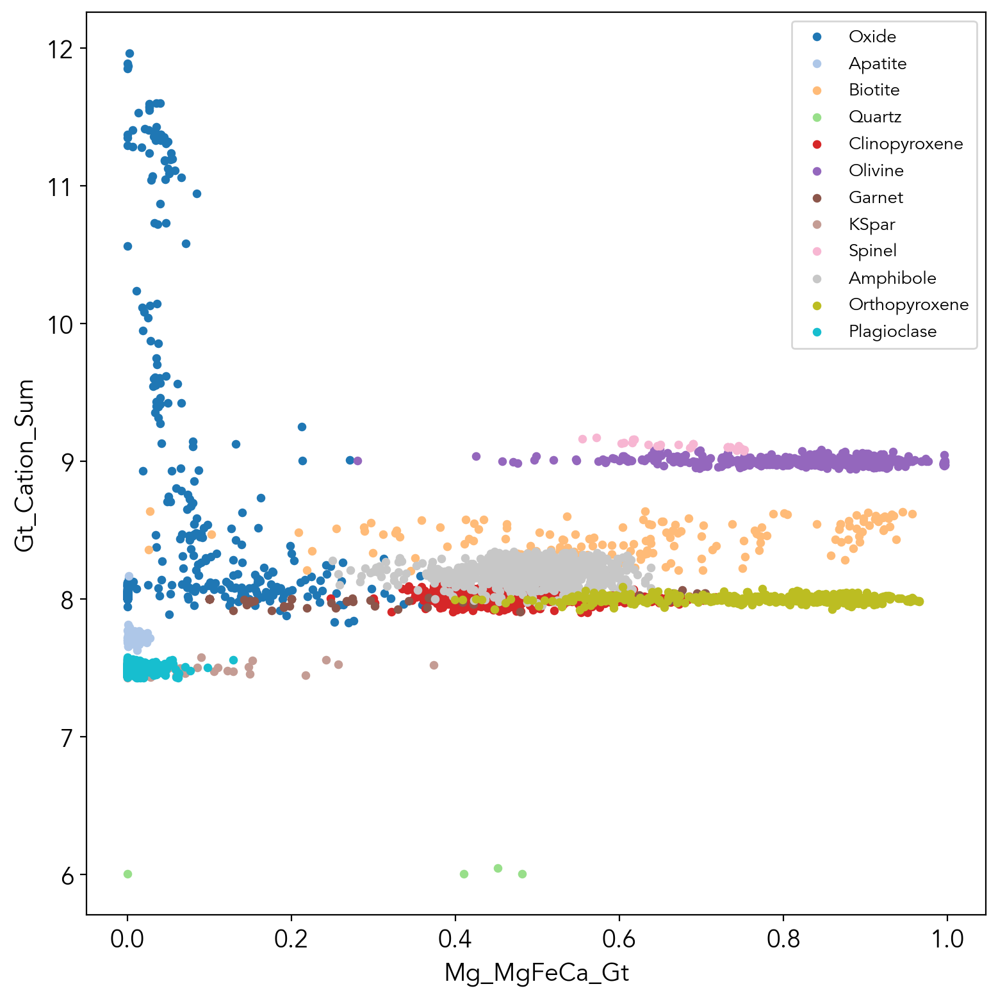

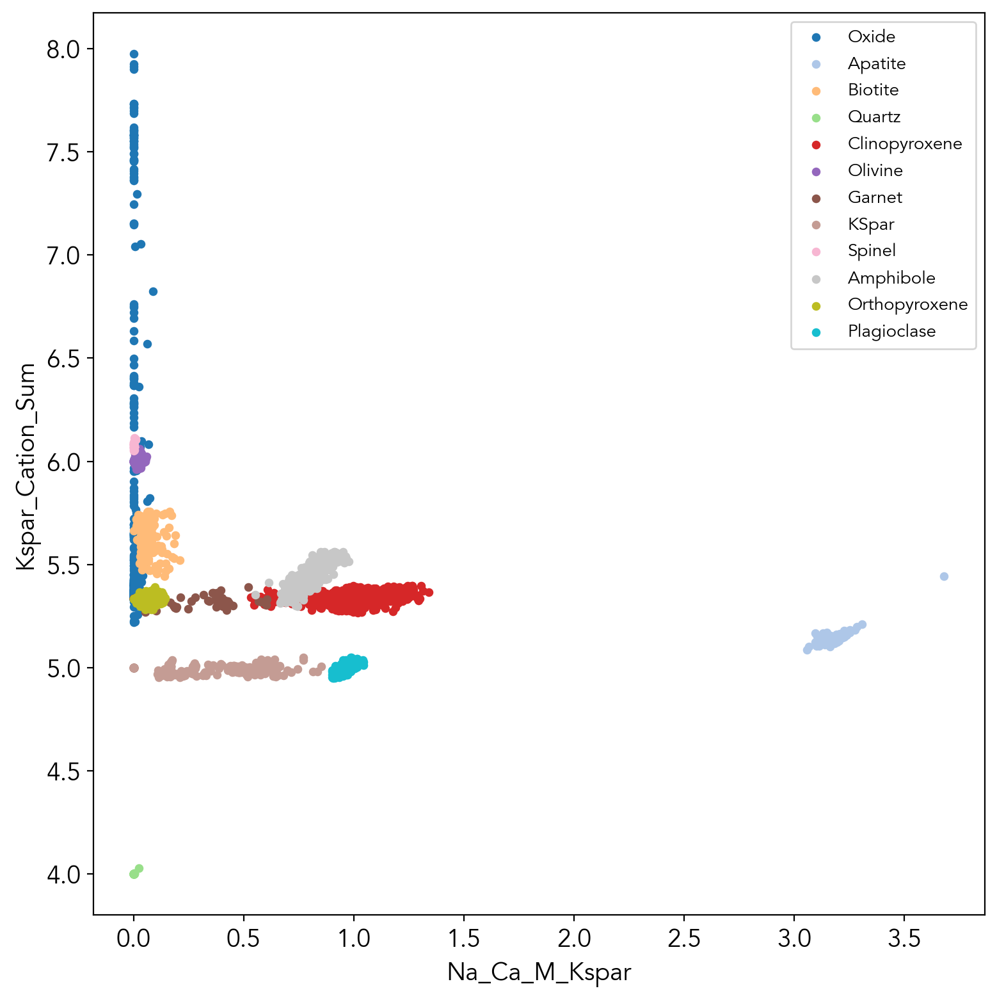

In [4]:
phase = list(set(LEPR_AllPhases.Phase))
z = range(1,len(phase))

tab = plt.get_cmap('tab20')
cNorm  = mcolors.Normalize(vmin=0, vmax=len(phase))
scalarMap = mcm.ScalarMappable(norm=cNorm, cmap=tab)


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Na_K_A_Amp'], LEPR_AllPhases[indx]['Amp_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Na_K_A_Amp')
ax.set_ylabel('Amp_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Ca_CaMgFe_Cpx'], LEPR_AllPhases[indx]['Cpx_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Ca_CaMgFe_Cpx')
ax.set_ylabel('Cpx_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Na_Ca_M_Plag'], LEPR_AllPhases[indx]['Plag_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Na_Ca_M_Plag')
ax.set_ylabel('Plag_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Mg_Fe_M_Ol'], LEPR_AllPhases[indx]['Ol_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Mg_Fe_M_Ol')
ax.set_ylabel('Ol_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Mg_Fe_M_Sp'], LEPR_AllPhases[indx]['Sp_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Mg_Fe_M_Sp')
ax.set_ylabel('Sp_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Fe_Ti_Ox'], LEPR_AllPhases[indx]['Ox_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Fe_Ti_Ox')
ax.set_ylabel('Ox_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Ca_P_Ap'], LEPR_AllPhases[indx]['Ap_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Ca_P_Ap')
ax.set_ylabel('Ap_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Si_Al_Bt'], LEPR_AllPhases[indx]['Bt_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Si_Al_Bt')
ax.set_ylabel('Bt_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Si_Al_Qz'], LEPR_AllPhases[indx]['Qz_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Si_Al_Qz')
ax.set_ylabel('Qz_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Mg_MgFeCa_Gt'], LEPR_AllPhases[indx]['Gt_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Mg_MgFeCa_Gt')
ax.set_ylabel('Gt_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()


fig, ax = plt.subplots(1, 1, figsize = (8, 8))
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax.scatter(LEPR_AllPhases[indx]['Na_Ca_M_Kspar'], LEPR_AllPhases[indx]['Kspar_Cation_Sum'], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax.set_xlabel('Na_Ca_M_Kspar')
ax.set_ylabel('Kspar_Cation_Sum')
ax.legend(prop={'size': 10})
plt.tight_layout()

0.04442405700683594 seconds elapsed


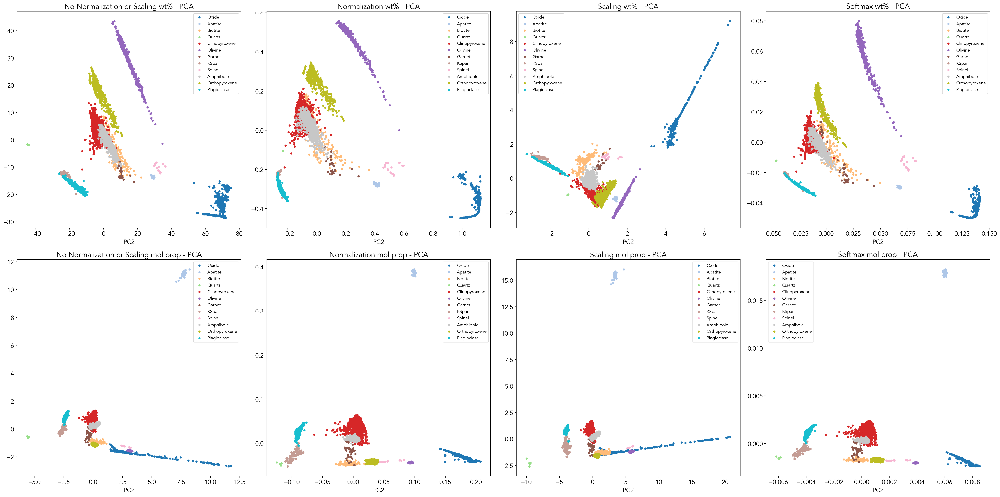

In [5]:
start = time.time()
pca = PCA(n_components = 2)
df_wt_pca = pca.fit_transform(LEPR_wt)
df_wt_norm_pca = pca.fit_transform(LEPR_wt_norm)
df_wt_scale_pca = pca.fit_transform(LEPR_wt_scale)
df_wt_softmax_pca = pca.fit_transform(LEPR_wt_softmax)

df_prop_pca = pca.fit_transform(LEPR_prop)
df_prop_norm_pca = pca.fit_transform(LEPR_prop_norm)
df_prop_scale_pca = pca.fit_transform(LEPR_prop_scale)
df_prop_softmax_pca = pca.fit_transform(LEPR_prop_softmax)
end = time.time()
print(str(end-start) + ' seconds elapsed')

# LEPR_wt_norm_df = pd.DataFrame(LEPR_wt_norm, columns = oxides)
# pd.plotting.scatter_matrix(LEPR_wt_norm_df, figsize = (15, 15), hist_kwds={'bins':20})
# plt.show()

# LEPR_wt_scale_df = pd.DataFrame(LEPR_wt_scale, columns = oxides)
# pd.plotting.scatter_matrix(LEPR_wt_scale_df, figsize = (15, 15), hist_kwds={'bins':20})
# plt.show()

phase = list(set(LEPR_AllPhases.Phase))
# z = range(1,len(phase))

tab = plt.get_cmap('tab20')
cNorm  = mcolors.Normalize(vmin=0, vmax=len(phase))
scalarMap = mcm.ScalarMappable(norm=cNorm, cmap=tab)

fig, ax = plt.subplots(2, 4, figsize = (32, 16))
ax = ax.flatten()

# PCA on wt. % 
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[0].scatter(df_wt_pca[indx][:, 0], df_wt_pca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[0].legend(prop={'size': 10})
ax[0].set_title('No Normalization or Scaling wt% - PCA')
ax[0].set_xlabel('PC1')
ax[0].set_xlabel('PC2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[1].scatter(df_wt_norm_pca[indx][:, 0], df_wt_norm_pca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[1].legend(prop={'size': 10})
ax[1].set_title('Normalization wt% - PCA')
ax[1].set_xlabel('PC1')
ax[1].set_xlabel('PC2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[2].scatter(df_wt_scale_pca[indx][:, 0], df_wt_scale_pca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[2].legend(prop={'size': 10})
ax[2].set_title('Scaling wt% - PCA')
ax[2].set_xlabel('PC1')
ax[2].set_xlabel('PC2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[3].scatter(df_wt_softmax_pca[indx][:, 0], df_wt_softmax_pca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[3].legend(prop={'size': 10})
ax[3].set_title('Softmax wt% - PCA')
ax[3].set_xlabel('PC1')
ax[3].set_xlabel('PC2')


for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[4].scatter(df_prop_pca[indx][:, 0], df_prop_pca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[4].legend(prop={'size': 10})
ax[4].set_title('No Normalization or Scaling mol prop - PCA')
ax[4].set_xlabel('PC1')
ax[4].set_xlabel('PC2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[5].scatter(df_prop_norm_pca[indx][:, 0], df_prop_norm_pca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[5].legend(prop={'size': 10})
ax[5].set_title('Normalization mol prop - PCA')
ax[5].set_xlabel('PC1')
ax[5].set_xlabel('PC2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[6].scatter(df_prop_scale_pca[indx][:, 0], df_prop_scale_pca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[6].legend(prop={'size': 10})
ax[6].set_title('Scaling mol prop - PCA')
ax[6].set_xlabel('PC1')
ax[6].set_xlabel('PC2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[7].scatter(df_prop_softmax_pca[indx][:, 0], df_prop_softmax_pca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[7].legend(prop={'size': 10})
ax[7].set_title('Softmax mol prop - PCA')
ax[7].set_xlabel('PC1')
ax[7].set_xlabel('PC2')

plt.tight_layout()
plt.show()

10.304790019989014 seconds elapsed


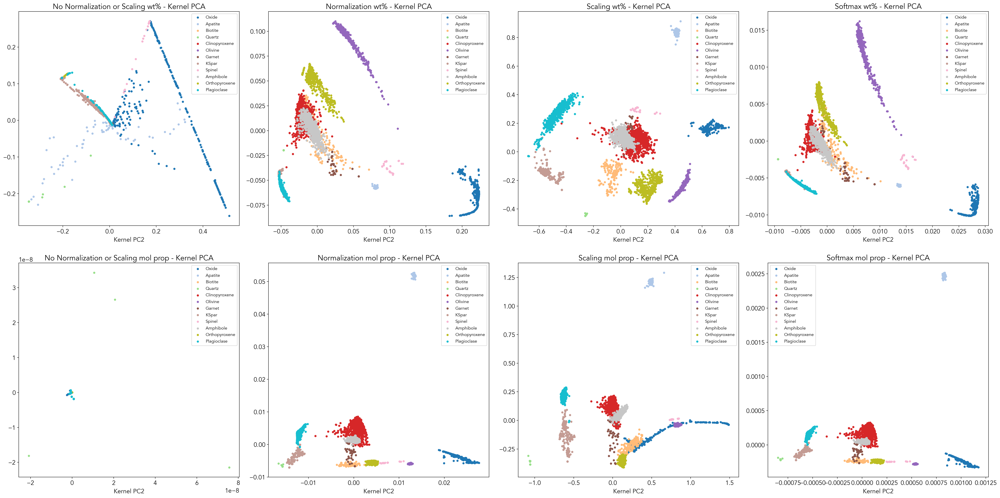

In [6]:
start = time.time()
kernelpca = KernelPCA(n_components = 2, kernel = 'sigmoid')
df_wt_kernelpca = kernelpca.fit_transform(LEPR_wt)
df_wt_norm_kernelpca = kernelpca.fit_transform(LEPR_wt_norm)
df_wt_scale_kernelpca = kernelpca.fit_transform(LEPR_wt_scale)
df_wt_softmax_kernelpca = kernelpca.fit_transform(LEPR_wt_softmax)

df_prop_kernelpca = kernelpca.fit_transform(LEPR_prop)
df_prop_norm_kernelpca = kernelpca.fit_transform(LEPR_prop_norm)
df_prop_scale_kernelpca = kernelpca.fit_transform(LEPR_prop_scale)
df_prop_softmax_kernelpca = kernelpca.fit_transform(LEPR_prop_softmax)
end = time.time()
print(str(end-start) + ' seconds elapsed')


phase = list(set(LEPR_AllPhases.Phase))
# z = range(1,len(phase))

tab = plt.get_cmap('tab20')
cNorm  = mcolors.Normalize(vmin=0, vmax=len(phase))
scalarMap = mcm.ScalarMappable(norm=cNorm, cmap=tab)

fig, ax = plt.subplots(2, 4, figsize = (32, 16))
ax = ax.flatten()


# PCA on wt. % 
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[0].scatter(df_wt_kernelpca[indx][:, 0], df_wt_kernelpca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[0].legend(prop={'size': 10})
ax[0].set_title('No Normalization or Scaling wt% - Kernel PCA')
ax[0].set_xlabel('Kernel PC1')
ax[0].set_xlabel('Kernel PC2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[1].scatter(df_wt_norm_kernelpca[indx][:, 0], df_wt_norm_kernelpca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[1].legend(prop={'size': 10})
ax[1].set_title('Normalization wt% - Kernel PCA')
ax[1].set_xlabel('Kernel PC1')
ax[1].set_xlabel('Kernel PC2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[2].scatter(df_wt_scale_kernelpca[indx][:, 0], df_wt_scale_kernelpca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[2].legend(prop={'size': 10})
ax[2].set_title('Scaling wt% - Kernel PCA')
ax[2].set_xlabel('Kernel PC1')
ax[2].set_xlabel('Kernel PC2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[3].scatter(df_wt_softmax_kernelpca[indx][:, 0], df_wt_softmax_kernelpca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[3].legend(prop={'size': 10})
ax[3].set_title('Softmax wt% - Kernel PCA')
ax[3].set_xlabel('Kernel PC1')
ax[3].set_xlabel('Kernel PC2')



for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[4].scatter(df_prop_kernelpca[indx][:, 0], df_prop_kernelpca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[4].legend(prop={'size': 10})
ax[4].set_title('No Normalization or Scaling mol prop - Kernel PCA')
ax[4].set_xlabel('Kernel PC1')
ax[4].set_xlabel('Kernel PC2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[5].scatter(df_prop_norm_kernelpca[indx][:, 0], df_prop_norm_kernelpca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[5].legend(prop={'size': 10})
ax[5].set_title('Normalization mol prop - Kernel PCA')
ax[5].set_xlabel('Kernel PC1')
ax[5].set_xlabel('Kernel PC2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[6].scatter(df_prop_scale_kernelpca[indx][:, 0], df_prop_scale_kernelpca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[6].legend(prop={'size': 10})
ax[6].set_title('Scaling mol prop - Kernel PCA')
ax[6].set_xlabel('Kernel PC1')
ax[6].set_xlabel('Kernel PC2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[7].scatter(df_prop_softmax_kernelpca[indx][:, 0], df_prop_softmax_kernelpca[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[7].legend(prop={'size': 10})
ax[7].set_title('Softmax mol prop - Kernel PCA')
ax[7].set_xlabel('Kernel PC1')
ax[7].set_xlabel('Kernel PC2')


plt.tight_layout()
plt.show()

2.9590630531311035 seconds elapsed


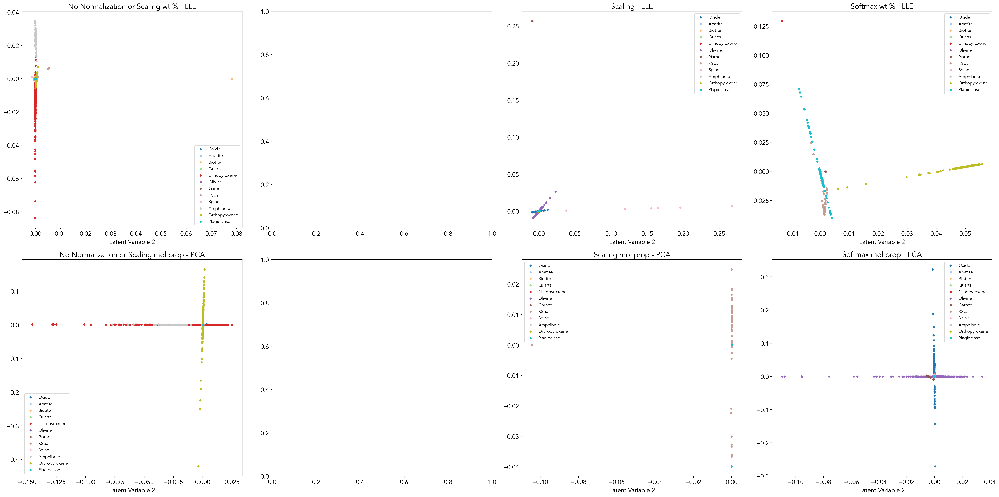

In [7]:
start = time.time()
lle = LocallyLinearEmbedding(n_components=2, n_neighbors=5,
                            eigen_solver = 'auto',
                            tol = 1e-06, max_iter = 100, 
                            neighbors_algorithm = 'auto', 
                            n_jobs = -1) 
df_wt_lle = lle.fit_transform(LEPR_wt) #fit model and transform
# df_norm_lle = lle.fit_transform(LEPR_wt_norm)
df_wt_scale_lle = lle.fit_transform(LEPR_wt_scale)
df_wt_softmax_lle = lle.fit_transform(LEPR_wt_softmax)

df_prop_lle = lle.fit_transform(LEPR_prop)
# df_prop_norm_lle = lle.fit_transform(LEPR_prop_norm)
df_prop_scale_lle = lle.fit_transform(LEPR_prop_scale)
df_prop_softmax_lle = lle.fit_transform(LEPR_prop_softmax)

end = time.time()
print(str(end-start) + ' seconds elapsed')

fig, ax = plt.subplots(2, 4, figsize = (32, 16))
ax = ax.flatten()

# PCA on wt. % 
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[0].scatter(df_wt_lle[indx][:, 0], df_wt_lle[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[0].legend(prop={'size': 10})
ax[0].set_title('No Normalization or Scaling wt % - LLE')
ax[0].set_xlabel('Latent Variable 1')
ax[0].set_xlabel('Latent Variable 2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
# for i in range(len(phase)):
#     indx = LEPR_AllPhases['Phase'] == phase[i]
#     ax[1].scatter(df_norm_lle[indx][:, 0], df_norm_lle[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
# ax[1].legend(prop={'size': 10})
# ax[1].set_title('Normalization wt % - LLE')
# ax[1].set_xlabel('Latent Variable 1')
# ax[1].set_xlabel('Latent Variable 2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[2].scatter(df_wt_scale_lle[indx][:, 0], df_wt_scale_lle[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[2].legend(prop={'size': 10})
ax[2].set_title('Scaling - LLE')
ax[2].set_xlabel('Latent Variable 1')
ax[2].set_xlabel('Latent Variable 2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[3].scatter(df_wt_softmax_lle[indx][:, 0], df_wt_softmax_lle[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[3].legend(prop={'size': 10})
ax[3].set_title('Softmax wt % - LLE')
ax[3].set_xlabel('Latent Variable 1')
ax[3].set_xlabel('Latent Variable 2')



for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[4].scatter(df_prop_lle[indx][:, 0], df_prop_lle[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[4].legend(prop={'size': 10})
ax[4].set_title('No Normalization or Scaling mol prop - PCA')
ax[4].set_xlabel('Latent Variable 1')
ax[4].set_xlabel('Latent Variable 2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
# for i in range(len(phase)):
#     indx = LEPR_AllPhases['Phase'] == phase[i]
#     ax[5].scatter(df_prop_scale_lle[indx][:, 0], df_prop_scale_lle[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
# ax[5].legend(prop={'size': 10})
# ax[5].set_title('Normalization mol prop - PCA')
# ax[5].set_xlabel('Latent Variable 1')
# ax[5].set_xlabel('Latent Variable 2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[6].scatter(df_prop_scale_lle[indx][:, 0], df_prop_scale_lle[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[6].legend(prop={'size': 10})
ax[6].set_title('Scaling mol prop - PCA')
ax[6].set_xlabel('Latent Variable 1')
ax[6].set_xlabel('Latent Variable 2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[7].scatter(df_prop_softmax_lle[indx][:, 0], df_prop_softmax_lle[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[7].legend(prop={'size': 10})
ax[7].set_title('Softmax mol prop - PCA')
ax[7].set_xlabel('Latent Variable 1')
ax[7].set_xlabel('Latent Variable 2')

plt.tight_layout()
plt.show()

/Users/sarahcshi/opt/anaconda3/envs/Geoinformatics/lib/python3.9/site-packages/sklearn/manifold/_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 16 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/sarahcshi/opt/anaconda3/envs/Geoinformatics/lib/python3.9/site-packages/sklearn/manifold/_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 17 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/sarahcshi/opt/anaconda3/envs/Geoinformatics/lib/python3.9/site-packages/sklearn/manifold/_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 20 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/sarahcshi/opt/anaconda3/

123.47733807563782 seconds elapsed


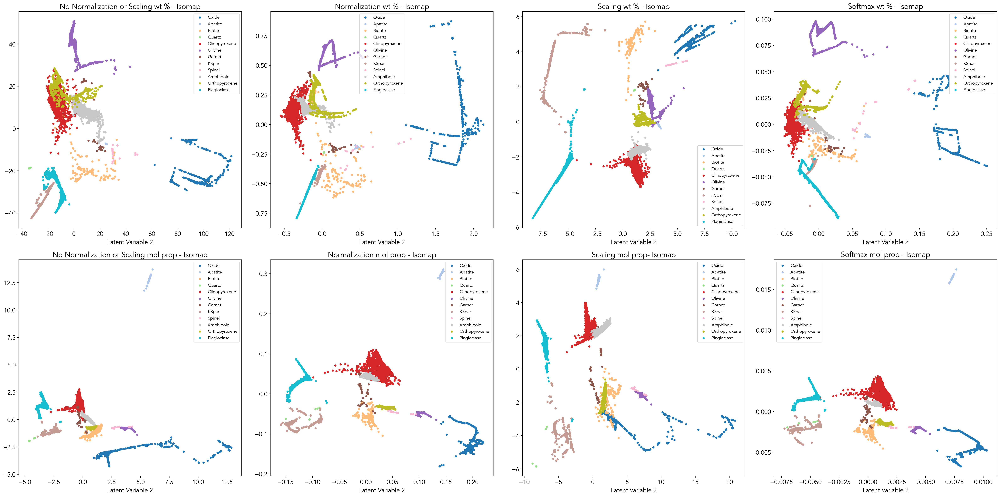

In [8]:
start = time.time()
isomap = Isomap(n_components=2) #resulting data has 2 dimensions, 'components'
df_wt_isomap = isomap.fit_transform(LEPR_wt) #fit model and transform
df_wt_norm_isomap = isomap.fit_transform(LEPR_wt_norm)
df_wt_scale_isomap = isomap.fit_transform(LEPR_wt_scale)
df_wt_softmax_isomap = isomap.fit_transform(LEPR_wt_softmax)

df_prop_isomap = isomap.fit_transform(LEPR_prop)
df_prop_norm_isomap = isomap.fit_transform(LEPR_prop_norm)
df_prop_scale_isomap = isomap.fit_transform(LEPR_prop_scale)
df_prop_softmax_isomap = isomap.fit_transform(LEPR_prop_softmax)
end = time.time()
print(str(end-start) + ' seconds elapsed')


fig, ax = plt.subplots(2, 4, figsize = (32, 16))
ax = ax.flatten()


# PCA on wt. % 
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[0].scatter(df_wt_isomap[indx][:, 0], df_wt_isomap[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[0].legend(prop={'size': 10})
ax[0].set_title('No Normalization or Scaling wt % - Isomap')
ax[0].set_xlabel('Latent Variable 1')
ax[0].set_xlabel('Latent Variable 2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[1].scatter(df_wt_norm_isomap[indx][:, 0], df_wt_norm_isomap[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[1].legend(prop={'size': 10})
ax[1].set_title('Normalization wt % - Isomap')
ax[1].set_xlabel('Latent Variable 1')
ax[1].set_xlabel('Latent Variable 2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[2].scatter(df_wt_scale_isomap[indx][:, 0], df_wt_scale_isomap[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[2].legend(prop={'size': 10})
ax[2].set_title('Scaling wt % - Isomap')
ax[2].set_xlabel('Latent Variable 1')
ax[2].set_xlabel('Latent Variable 2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[3].scatter(df_wt_softmax_isomap[indx][:, 0], df_wt_softmax_isomap[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[3].legend(prop={'size': 10})
ax[3].set_title('Softmax wt % - Isomap')
ax[3].set_xlabel('Latent Variable 1')
ax[3].set_xlabel('Latent Variable 2')


for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[4].scatter(df_prop_isomap[indx][:, 0], df_prop_isomap[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[4].legend(prop={'size': 10})
ax[4].set_title('No Normalization or Scaling mol prop - Isomap')
ax[4].set_xlabel('Latent Variable 1')
ax[4].set_xlabel('Latent Variable 2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[5].scatter(df_prop_norm_isomap[indx][:, 0], df_prop_norm_isomap[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[5].legend(prop={'size': 10})
ax[5].set_title('Normalization mol prop - Isomap')
ax[5].set_xlabel('Latent Variable 1')
ax[5].set_xlabel('Latent Variable 2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[6].scatter(df_prop_scale_isomap[indx][:, 0], df_prop_scale_isomap[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[6].legend(prop={'size': 10})
ax[6].set_title('Scaling mol prop- Isomap')
ax[6].set_xlabel('Latent Variable 1')
ax[6].set_xlabel('Latent Variable 2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[7].scatter(df_prop_softmax_isomap[indx][:, 0], df_prop_softmax_isomap[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[7].legend(prop={'size': 10})
ax[7].set_title('Softmax mol prop - Isomap')
ax[7].set_xlabel('Latent Variable 1')
ax[7].set_xlabel('Latent Variable 2')

plt.tight_layout()
plt.show()

139.6258041858673 seconds elapsed


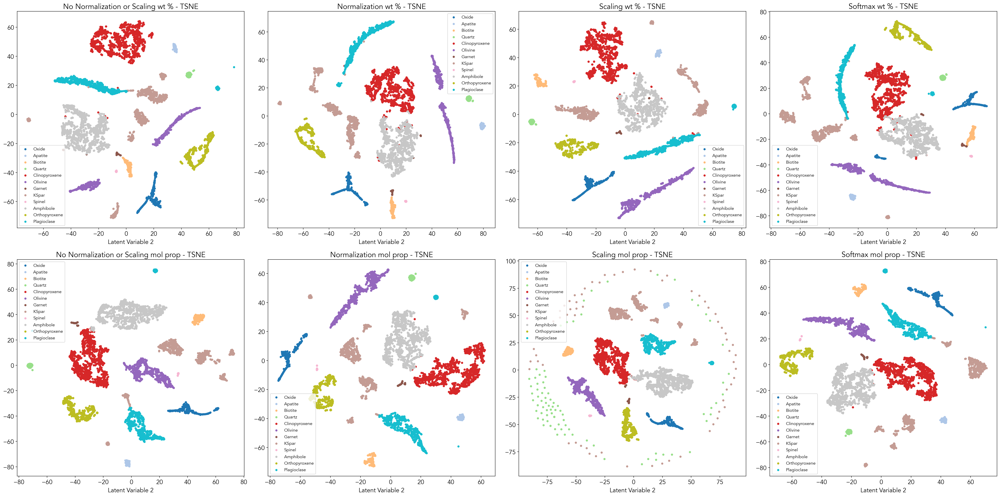

In [9]:
# this is for visualization though, does not work so well for clustering. 

start = time.time()
tsne = TSNE(n_components=2, learning_rate='auto',
            init='random', perplexity=50, n_jobs = -1)
df_wt_tsne = tsne.fit_transform(LEPR_wt) #fit model and transform
df_wt_norm_tsne = tsne.fit_transform(LEPR_wt_norm)
df_wt_scale_tsne = tsne.fit_transform(LEPR_wt_scale)
df_wt_softmax_tsne = tsne.fit_transform(LEPR_wt_softmax)

df_prop_tsne = tsne.fit_transform(LEPR_prop) #fit model and transform
df_prop_norm_tsne = tsne.fit_transform(LEPR_prop_norm)
df_prop_scale_tsne = tsne.fit_transform(LEPR_prop_scale)
df_prop_softmax_tsne = tsne.fit_transform(LEPR_prop_softmax)

end = time.time()
print(str(end-start) + ' seconds elapsed')

phase = list(set(LEPR_AllPhases.Phase))
# z = range(1,len(phase))

tab = plt.get_cmap('tab20')
cNorm  = mcolors.Normalize(vmin=0, vmax=len(phase))
scalarMap = mcm.ScalarMappable(norm=cNorm, cmap=tab)

fig, ax = plt.subplots(2, 4, figsize = (32, 16))
ax = ax.flatten()
# PCA on wt. % 
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[0].scatter(df_wt_tsne[indx][:, 0], df_wt_tsne[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[0].legend(prop={'size': 10})
ax[0].set_title('No Normalization or Scaling wt % - TSNE')
ax[0].set_xlabel('Latent Variable 1')
ax[0].set_xlabel('Latent Variable 2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[1].scatter(df_wt_norm_tsne[indx][:, 0], df_wt_norm_tsne[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[1].legend(prop={'size': 10})
ax[1].set_title('Normalization wt % - TSNE')
ax[1].set_xlabel('Latent Variable 1')
ax[1].set_xlabel('Latent Variable 2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[2].scatter(df_wt_scale_tsne[indx][:, 0], df_wt_scale_tsne[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[2].legend(prop={'size': 10})
ax[2].set_title('Scaling wt % - TSNE')
ax[2].set_xlabel('Latent Variable 1')
ax[2].set_xlabel('Latent Variable 2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[3].scatter(df_wt_softmax_tsne[indx][:, 0], df_wt_softmax_tsne[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[3].legend(prop={'size': 10})
ax[3].set_title('Softmax wt % - TSNE')
ax[3].set_xlabel('Latent Variable 1')
ax[3].set_xlabel('Latent Variable 2')


for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[4].scatter(df_prop_tsne[indx][:, 0], df_prop_tsne[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[4].legend(prop={'size': 10})
ax[4].set_title('No Normalization or Scaling mol prop - TSNE')
ax[4].set_xlabel('Latent Variable 1')
ax[4].set_xlabel('Latent Variable 2')

# My feature_normalisation function has the same function as normalization from sklearn.preprocessing
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[5].scatter(df_prop_norm_tsne[indx][:, 0], df_prop_norm_tsne[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[5].legend(prop={'size': 10})
ax[5].set_title('Normalization mol prop - TSNE')
ax[5].set_xlabel('Latent Variable 1')
ax[5].set_xlabel('Latent Variable 2')

# Scaling
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[6].scatter(df_prop_scale_tsne[indx][:, 0], df_prop_scale_tsne[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[6].legend(prop={'size': 10})
ax[6].set_title('Scaling mol prop - TSNE')
ax[6].set_xlabel('Latent Variable 1')
ax[6].set_xlabel('Latent Variable 2')

# Softmax
for i in range(len(phase)):
    indx = LEPR_AllPhases['Phase'] == phase[i]
    ax[7].scatter(df_prop_softmax_tsne[indx][:, 0], df_prop_softmax_tsne[indx][:, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
ax[7].legend(prop={'size': 10})
ax[7].set_title('Softmax mol prop - TSNE')
ax[7].set_xlabel('Latent Variable 1')
ax[7].set_xlabel('Latent Variable 2')

plt.tight_layout()
plt.show()

starting LEPR_AllPhases
[001/050] train_loss: 0.611037, test_loss: 0.411289, time: 0.58 s
[002/050] train_loss: 0.415682, test_loss: 0.329736, time: 0.17 s
[003/050] train_loss: 0.330120, test_loss: 0.265785, time: 0.18 s
[004/050] train_loss: 0.270387, test_loss: 0.218733, time: 0.19 s
[005/050] train_loss: 0.226001, test_loss: 0.182593, time: 0.18 s
[006/050] train_loss: 0.196333, test_loss: 0.157556, time: 0.18 s
[007/050] train_loss: 0.171223, test_loss: 0.139773, time: 0.19 s
[008/050] train_loss: 0.147611, test_loss: 0.114208, time: 0.19 s
[009/050] train_loss: 0.124027, test_loss: 0.097280, time: 0.18 s
[010/050] train_loss: 0.097411, test_loss: 0.071951, time: 0.18 s
[011/050] train_loss: 0.074351, test_loss: 0.055700, time: 0.17 s
[012/050] train_loss: 0.056491, test_loss: 0.042921, time: 0.24 s
[013/050] train_loss: 0.043526, test_loss: 0.037310, time: 0.19 s
[014/050] train_loss: 0.036581, test_loss: 0.031199, time: 0.18 s
[015/050] train_loss: 0.031882, test_loss: 0.025015,

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped


LEPR_AllPhases done! Time: 10.22953486442566s


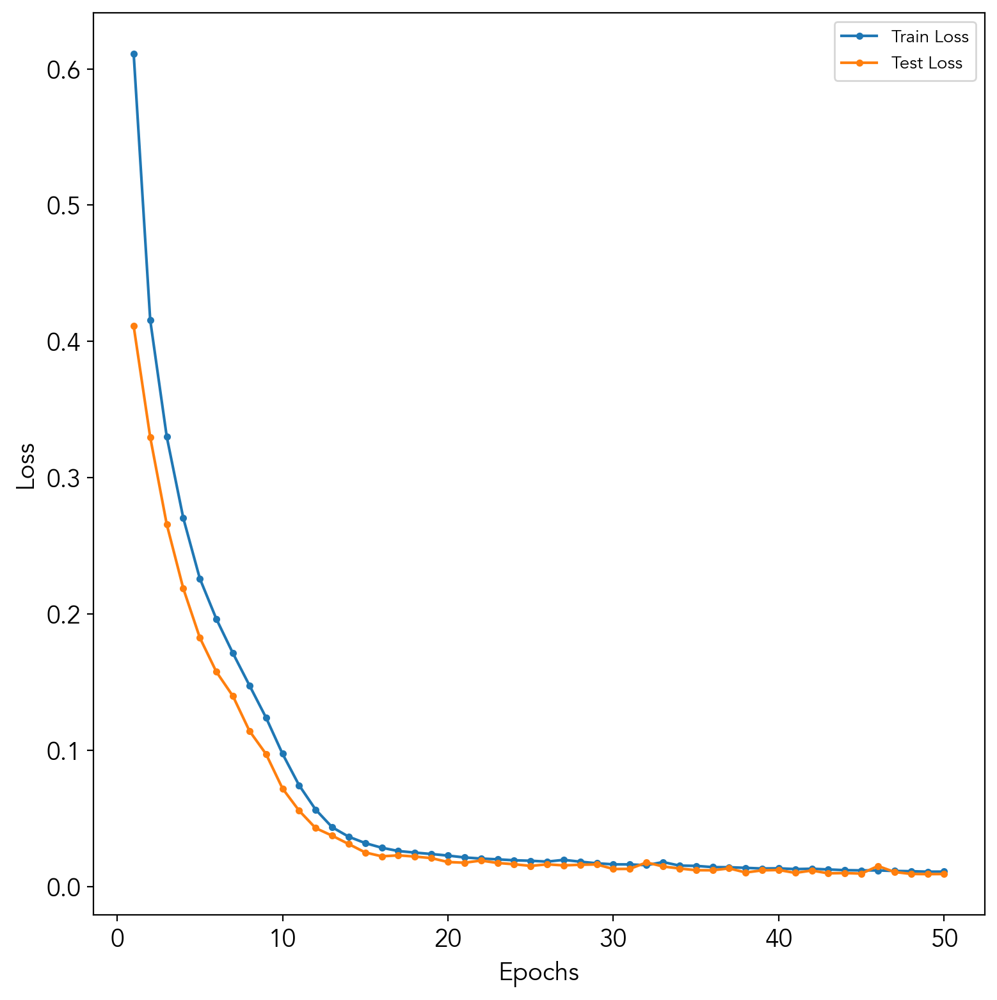

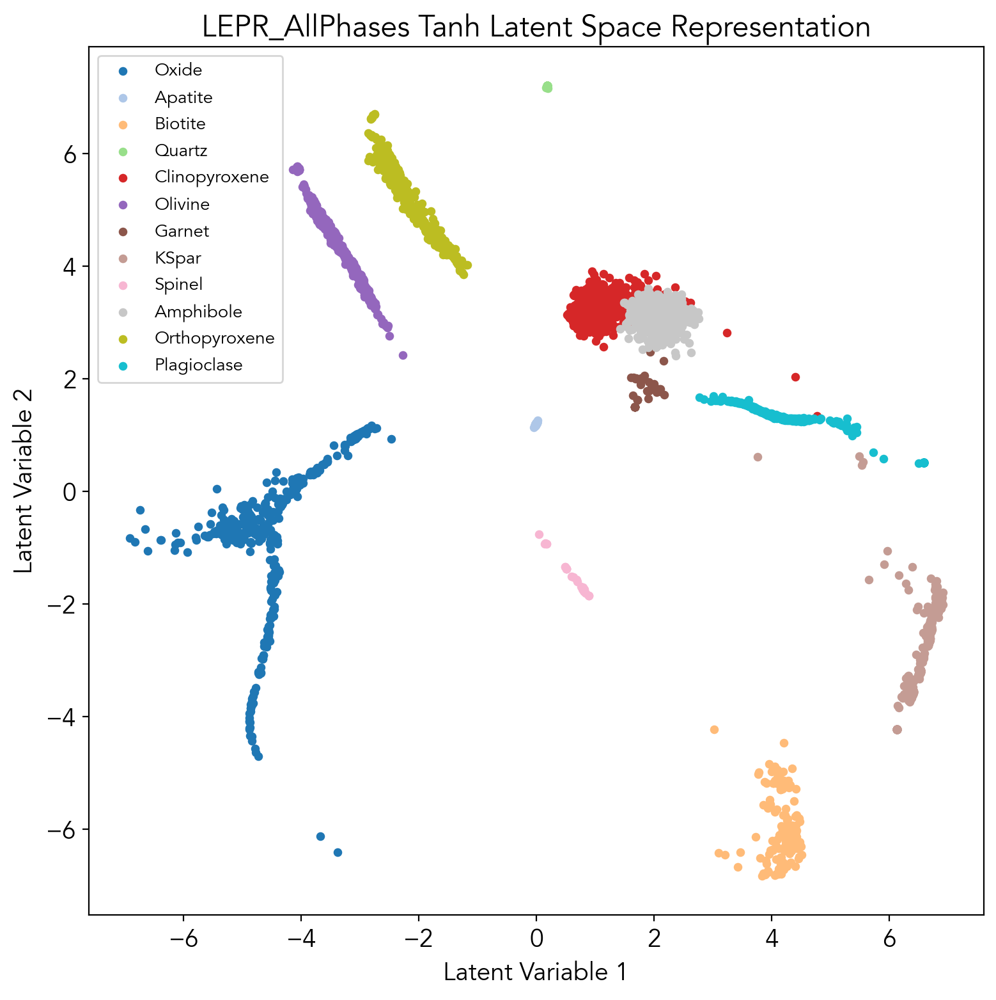

In [10]:
def same_seeds(seed):
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # if you are using multi-GPU.
    np.random.seed(seed)  # Numpy module.
    random.seed(seed)  # Python random module.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

def autoencode(name):

    LEPR_AllPhases = pd.read_csv('./LEPR/' + name + '.csv')
    oxides = ['SiO2', 'TiO2', 'Al2O3', 'FeOt', 'MnO', 'MgO', 'CaO', 'Na2O', 'K2O', 'Cr2O3']
    LEPR_wt = LEPR_AllPhases[oxides]
    LEPR_mol = calculate_mol_proportions(LEPR_wt)
    LEPR_wt = LEPR_wt.to_numpy()
    LEPR_mol = LEPR_mol.to_numpy()

    #perform z-score normalisation
    array_norm_wt = normalize(LEPR_wt)
    array_norm_mol = normalize(LEPR_mol)

    array_norm = array_norm_mol 
    ss = StandardScaler()
    array_scale = ss.fit_transform(LEPR_wt)

    # LEPR_prop = LEPR_AllPhases[phase_props]
    # LEPR_prop = LEPR_prop.fillna(0).to_numpy()

    # LEPR_prop_norm = normalize(LEPR_prop)
    array_norm = array_scale

    #split the dataset into train and test sets
    train_data, test_data = train_test_split(array_norm, test_size=0.1, random_state=42)

    #define datasets to be used with PyTorch - see autoencoder file for details
    feature_dataset = FeatureDataset(train_data)
    test_dataset = FeatureDataset(test_data)   

    #autoencoder params:
    lr = 1e-3
    wd = 0
    batch_size = 50
    #use half the data available
    epochs = 50
    input_size = feature_dataset.__getitem__(0).size(0)

    #define data loaders
    feature_loader = DataLoader(feature_dataset, batch_size=batch_size,shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size,shuffle=True)

    #define model
    model = Tanh_Autoencoder(input_dim=input_size).to(device)

    #use ADAM optimizer with mean squared error loss function
    optimizer = torch.optim.Adam(model.parameters(), lr=lr,weight_decay=wd) 
    criterion = nn.MSELoss()

    #train model using pre-defined function
    train_loss, test_loss = train(model, optimizer, feature_loader, test_loader, epochs, criterion)
    np.savez('./LEPR/' + name + '_tanh_loss.npz', train_loss = train_loss, test_loss = test_loss)

    fig, ax = plt.subplots(1, 1, figsize = (8, 8))
    ax.plot(np.linspace(1, epochs, epochs), train_loss, '.-', label = 'Train Loss')
    ax.plot(np.linspace(1, epochs, epochs), test_loss, '.-', label = 'Test Loss')
    ax.set_xlabel("Epochs")
    ax.set_ylabel("Loss")
    ax.legend(prop={'size': 10})
    plt.tight_layout()
    plt.savefig('./LEPR/' + name + '_tanh_testtrainloss.pdf',)

    #transform entire dataset to latent space
    z = getLatent(model, array_norm)

    phase = list(set(LEPR_AllPhases.Phase))

    tab = plt.get_cmap('tab20')
    cNorm  = mcolors.Normalize(vmin=0, vmax=len(phase))
    scalarMap = mcm.ScalarMappable(norm=cNorm, cmap=tab)

    #plot latent representation
    fig, ax = plt.subplots(1, 1, figsize = (8, 8))
    for i in range(len(phase)):
        indx = LEPR_AllPhases['Phase'] == phase[i]
        ax.scatter(z[indx, 0], z[indx, 1], s=15, color=scalarMap.to_rgba(i), lw=1, label=phase[i])
    ax.set_xlabel("Latent Variable 1")
    ax.set_ylabel("Latent Variable 2")
    ax.set_title(name + " Tanh Latent Space Representation")
    ax.legend(prop={'size': 10})
    plt.tight_layout()
    plt.savefig('./LEPR/' + name + '_latentspace.pdf',)

    #save main model params
    model_path = './LEPR/' + name + "_tanh_params.pt"
    save_model(model, optimizer, model_path)

    #save all other params
    conc_file = name + "_tanh.npz"
    np.savez('./LEPR/' + name + "_tanh.npz", batch_size = batch_size, epochs = epochs, input_size = input_size, 
            conc_file = conc_file, z = z)

#start execute here
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')    
same_seeds(42)

names = ["LEPR_AllPhases"]
i = 0
start_time = time.time()
print("starting " + str(names[i]))
autoencode(names[i])
print(names[i] + " done! Time: " + str(time.time() - start_time) + "s")